# MODELE INTERPRETABILITY

In [1]:
import pandas as pd
import numpy as np
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

# Sommaire
- [1. Traitement préliminaire des données Churn](#sect1)
- [2. Interprétabilité d'un modèle](#sect2)
    - [2.1. Intérêt de l'interprétabilité](#sect21)
    - [2.2. ELI5](#sect22)
    - [2.3. LIME](#sect23)
    - [2.4. SHAP](#sect24)
        - [2.4.1. Valeur Shapley](#sect241)
        - [2.4.2. SHAP](#sect242)

# <a name="sect1"></a> 1. Traitement préliminaire des données Churn

In [2]:
#Lecture du dataset
wd = os.getcwd()
churn_df = pd.read_csv(wd+"\\churn.csv")

#Transforme le type de la colonne 'Aera Code' en string
churn_df['Area Code'] = churn_df['Area Code'].astype(str)

#Transorme la colonne quantitative 'Area Code' en colonne qualitative en créant 2 nouvelles colonnes booléennes
churn_df = pd.concat([churn_df,pd.get_dummies(churn_df['Area Code'],prefix='area_', drop_first=True)],axis=1)

#Supprime la colonne 'Area Code'
churn_df.drop(['Area Code'], axis=1, inplace=True)

#Extrait la cible et remplace les modalité True/False par 1/0
y = churn_df["Churn?"].map({"True.": 1, "False.": 0})

#Extrait la base d'apprentissage et de test 
state_train, state_test, y_train, y_test = train_test_split(churn_df['State'], y, test_size=0.4, random_state=2020)

#Pourcentage de True dans chaque état de la colonne 'State'
taux_response_state_train = pd.crosstab(state_train,y_train).apply(lambda r: r/r.sum(), axis=1)[1]
taux_response_state_test = pd.crosstab(state_test,y_test).apply(lambda r: r/r.sum(), axis=1)[1]

#Remplace le code des états de la colonne 'State' par le pourcentage de True calculé précédemment
churn_df['State'].replace(list(taux_response_state_train.index), list(taux_response_state_train), inplace=True)

#Renomme la colonne 'State'
churn_df.rename(columns={"State": "churnMoy_state"},inplace=True)

#Supprime deux colonnes inutiles
churn_X = churn_df.drop(['Phone','Churn?'], axis=1)

#Remplace les modalité no/yes des colonnes 'Int'l Plan' et "VMail Plan' par True/False
churn_X[["Int'l Plan","VMail Plan"]] = churn_X[["Int'l Plan","VMail Plan"]] == 'yes'

#Extrait le nom des colonnes
feature_names = list(churn_X.columns) 

churn_X.head()

,churnMoy_state,Account Length,Int'l Plan,VMail Plan,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,area__415,area__510
0,0.176471,128,False,True,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,1,0
1,0.090909,107,False,True,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,1,0
2,0.279070,137,False,False,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,1,0
3,0.090909,84,True,False,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0,0
4,0.125000,75,True,False,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,1,0


In [3]:
norm=StandardScaler().fit(churn_X.astype(float))
# On applique une normalisation centrée réduite sur les variables
X = norm.transform(churn_X.astype(float))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=2020)

In [4]:
rf = RandomForestClassifier(n_estimators = 300,
                                       criterion = "gini",
                                       max_features = "sqrt",
                                       max_depth = 8,
                                       min_samples_split = 30,
                                       min_samples_leaf = 20,                                       
                                       max_leaf_nodes = 100,
                                       bootstrap = True,
                                       oob_score = True,
                                       n_jobs = -1, # coeurs
                                       random_state = 1234,
                                       class_weight="balanced"
                                       )
rf.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=8, max_features='sqrt',
            max_leaf_nodes=100, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=20,
            min_samples_split=30, min_weight_fraction_leaf=0.0,
            n_estimators=300, n_jobs=-1, oob_score=True, random_state=1234,
            verbose=0, warm_start=False)

# <a name="sect2"></a> 2. Interprétabilité d'un modèle
## <a name="sect21"></a> 2.1. Intérêt de l'interprétabilité
Pour commencer, l'**interprétabilité** c'est la capacité à expliquer ou présenter de manière compréhensible à un humain. Les algorithmes sont maintenant trés présents en industrie et sont quelques fois utilisés de manière automatique pour prendre des décisions importe affectant une population :
* Assurance : "Prédire le prix optimal pour facturer un client"
* Banque : "Prédire à qui donner un prêt ou non"
* Police : "Prédire qui est plus susceptible de commetre un crime"
* Réseaux sociaux : "Prédire qui est plus susceptible de cliquer sur une pub"

Dans ces conditions, utiliser des modèles 'black box" ne donnent pas confiance à l'affectation des clients que ferait le modèle.

Quelques modèles sont simples à interpréter comme la régression linéaire, la régression logistique ou l'arbre de décision, d'autres sont plus difficiles à interpréter comme le random forest et d'autres encore sont particulièrement difficiles à interpréter comme le Réseau de neurones. Dans des situations où il faut expliquer le modèle, le premier choix est un modèle simple et facile à interpréter. Mais parfois, face à des problématiques complexes, il est nécessaire d'utiliser des modèles plus complexes afin d'obtenir des résultats plus efficaces. Le but est donc de trouver un bon **compromis entre l'interprétabilité et la performance**. Des techniques d'interprétabilités permettent d'utiliser des modèles plus complexes sans perdre tout le bénéfice de l'interprétabilité. L'objectif de ce tutoriel est donc d'introduire quelques unes de ces techniques.

Il y a deux façons d'expliquer un modèle. La première manière est d'inspecter le modèle en profondeur via les poids de ce dernier. De cette manière, il sera possible de repérer les symptômes (valeurs, variables...) importants dans la décision du modèle et quels sont leurs impacts sur la sortie, cette étude s'effectue via une interprétation globale ou locale du modèle. La seconde manière est d'expliquer concrètement pourquoi le modèle a pris telle ou telle décision.

Une interprétation globale permet d'étudier l'importance des variables pour un modèle. Plus une variable discrétisera le dataset plus elle sera importante pour le modèle. Sur des algorithmes simples comme l'arbre de décision, il est trés facile de repérer ces variables, ce sont celles qui sont le plus haut dans l'arbre mais sur des modèles plus complexes il est parfois difficile d'interpréter le modèle pour les repérer.

Une interprétation locale permet d'étudier l'importance des variables pour un modèle pour une prédiction. En phase de test, pour une observation on va regarder les variables qui ont le plus aidé à déterminer sa classe.

Dans ce tutoriel, nous détaillerons trois librairies implémentant chacunes trois algorithmes d'interprétations de modèle :
* **ELI5** : Explain it like I'am 5
* **LIME** : Local Interpretable Model-Agnostic Explanations
* **SHAP** : Shapley Additive Explanations

## <a name="sect22"></a> 2.2. ELI5
ELI5 fournit un moyen de récupérer les variables d'importances depuis des modèles "black-box" en mesurant comment le score (accuracy, F1...) décroit lorsqu'une variable n'est plus disponible et d'établir en conséquence un poid à cette variable. Cette première méthode se base sur la construction du modèle.

Une méthode peut être de supprimer une variable puis de ré-entrainer un modèle et de vérifier le score. Mais de cette manière il faudrait ré-entrainer le modèle pour chaque variable, ce qui serait très couteux en en terme de compléxité.

Pour éviter de ré-entrainer le modèle et de supprimer des variables, on remplace les valeurs de cette dernière par du bruit aléatoire. La variable est toujours là mais ne contient plus d'informations utiles. Cette méthode fonctionne uniquement si le bruit est généré avec la même distribution que la variables originelle. Une manière simple de faire celà est de mélanger les valeurs de la variable et d'utiliser une valeur d'autres observations.

Cette fonctionnalité est disponible pour les librairies : scikit-learn, XGBoost, LightGBM, CatBoost, lightning, sklearn-crfsuite et Keras mais aussi pour les classifieurs de type text-mining.

Pour installer les packeges éxecuter la commande `pip install eli5` ou avec anaconda la commande `conda install -c conda-forge eli5`.

La fonction `show_weights` permet de voir le poids des variables dans le modèle grâce au modèle (rf) et aux noms des variables (features_names). Le poids d'une variable permet de définir l'importance qu'elle a dans la décision du modèle. Grâce au poids on sait par exemple que la variable 'CustServ Calls' est la variable la plus discriminante pour le Random Forest. Il est possible d'utiliser la fonction `explain_weights_df` avec les mêmes paramètres si l'on souhaite une sortie Dataframe.

In [6]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(rf).fit(X_test, y_test)
eli5.show_weights(perm, feature_names=feature_names)

Weight,Feature
0.0619 ± 0.0020,CustServ Calls
0.0372 ± 0.0067,Int'l Plan
0.0163 ± 0.0096,Day Charge
0.0153 ± 0.0049,Day Mins
0.0096 ± 0.0022,Intl Calls
0.0096 ± 0.0045,Eve Mins
0.0078 ± 0.0041,Eve Charge
0.0076 ± 0.0006,Intl Mins
0.0048 ± 0.0022,Intl Charge
0.0048 ± 0.0079,churnMoy_state


La fonction `show_prediction` permet d'observer chaque variable une à une pour observer la manière dont le modèle va effectuer sa décision sur une observation. Il faut passer le modèle (rf) une observation (X_test[i]) et le nom des variables (features_names). Sur l'observation suivante, on peut voir que c'est les variables 'CustServ Calls' et 'Day Charge' qui ont eu le plus de poids dans la décision. De la même manière, il est possible d'utiliser la fonction `explain_prediction_df` avec les mêmes paramètres si l'on souhaite une sortie Dataframe.

In [46]:
i=1
print("Label de l'observation:", y_test.iloc[i], ", label prédit par le random forest :", rf.predict([X_test[i]])[0])
eli5.show_prediction(rf, X_test[i], feature_names=feature_names, show_feature_values=True)

Label de l'observation: 0 , label prédit par le random forest : 0


In [47]:
i=19
print("Label de l'observation:", y_test.iloc[i], ", label prédit par le random forest :", rf.predict([X_test[i]])[0])
eli5.show_prediction(rf, X_test[i], feature_names=feature_names, show_feature_values=True)

Label de l'observation: 0 , label prédit par le random forest : 1


In [48]:
i=61
print("Label de l'observation:", y_test.iloc[i], ", label prédit par le random forest :", rf.predict([X_test[i]])[0])
eli5.show_prediction(rf, X_test[i], feature_names=feature_names, show_feature_values=True)

Label de l'observation: 1 , label prédit par le random forest : 0


In [49]:
i=0
print("Label de l'observation:", y_test.iloc[i], ", label prédit par le random forest :", rf.predict([X_test[i]])[0])
eli5.show_prediction(rf, X_test[i], feature_names=feature_names, show_feature_values=True)

Label de l'observation: 1 , label prédit par le random forest : 1


## <a name="sect23"></a>2.3. LIME

LIME est un algorithme agnostique d'interprétabilité des modèles, cela signifie que l'algorithme traite le modèle comme une boite noire. L'idée est d'entraîner un modèle interprétable localement autour d'une observation que l'on veut exliquer en générant des observations similaires autour de ce point. Un modèle 'white box' va être entraîné avec ces observations et ces labels générés.

L'algorithme fonctionne comme suit :
* Créer un faux dataset à partir de l'observation dont on souhaite l'interprétation
    * variable numérique : Echantillonnage selon la loi Normale(0,1) puis en application de l'inverse de l'opération de centrage-réduction d'après la moyenne et l'écart-type de la base d'apprentissage.
    * variable catégorielle : Echantillonnage selon la distribution de la base d'apprentissage et création d'une variable binaire qui vaut 1 si la valeur de la variable est identique à celle de l'observation que l'on souhaite interpréter. 
* Utiliser le modèle 'black box' pour établir des prédictions
* Entrainer un modèle pondéré interprétable 'white box' utilisant les données générées et les labels prédits
* Expliquer l'observation originale avec le poids du modèle 'white box'

Cette méthode peut être instable dû à la génération des nouveaux points aléatoirement.

La librairie s'installe avec la commande `pip install lime`.

In [8]:
from lime.lime_tabular import LimeTabularExplainer
explainer = LimeTabularExplainer(X_train, training_labels=y_train, feature_names=feature_names, discretize_continuous=True)

i=1
print("Label de l'observation:", y_test.iloc[i], ", label prédit par le random forest :", rf.predict([X_test[i]])[0])
expdt0 = explainer.explain_instance(X_test[i],rf.predict_proba,num_features=5)
expdt0.show_in_notebook(show_table=True)

Label de l'observation: 0 , label prédit par le random forest : 0


In [24]:
i=19
print("Label de l'observation:", y_test.iloc[i], ", label prédit par le random forest :", rf.predict([X_test[i]])[0])
expdt0 = explainer.explain_instance(X_test[i],rf.predict_proba,num_features=5)
expdt0.show_in_notebook(show_table=True)

Label de l'observation: 0 , label prédit par le random forest : 1


In [25]:
i=61
print("Label de l'observation:", y_test.iloc[i], ", label prédit par le random forest :", rf.predict([X_test[i]])[0])
expdt0 = explainer.explain_instance(X_test[i],rf.predict_proba,num_features=5)
expdt0.show_in_notebook(show_table=True)

Label de l'observation: 1 , label prédit par le random forest : 0


In [9]:
i=0
print("Label de l'observation:", y_test.iloc[i], ", label prédit par le random forest :", rf.predict([X_test[i]])[0])
expdt0 = explainer.explain_instance(X_test[i],rf.predict_proba,num_features=5)
expdt0.show_in_notebook(show_table=True)

Label de l'observation: 1 , label prédit par le random forest : 1


Sur les mini-rapports ci-dessus, on a trois informations :
* A gauche : la probabilité de prédiction pour la classe 0 et 1
* Au milieu : les 5 plus discriminantes variables. Les attributs en bleu supporte la classe 0 et les attributs en orange la classe 1. Les valeurs sur les bars donnent l'importance de ces variables.
* A droite : Pour chacune des plus importantes variables la couleurs de la classe qu'elle soutient.

Ces représentations permettent une interprétation locale plus simple des résultats qui seront simulaires à ceux du random forest.

## <a name="sect24"></a>2.4. SHAP
### <a name="sect241"></a>2.4.1. Valeur Shapley
Avant d'expliquer la méthode SHAP, il faut d'abord bien comprendre comment est construite la valeur Shapley. 

* **Idée générale**

Imaginons un contexte dans lequel on chercherait à estimer le prix (la prédiction du modèle) d'un bien immobilier en se basant sur ses caractéristiques :
* surface : 50m2
* étage : 2e
* parc : oui
* chat : non
pour un prix estimé total de 300K euros.
On possède une base de données contenant un ensemble de bien comme celui ci-dessus et on connait la moyenne des biens : 310K euros.

L'objectif est de réussir à expliquer pourquoi ce bien est-il plus cher qu'un autre. Quelles caractéristiques font que ce bien est moins cher que la moyenne des biens ? Pour celà on va calculer la différence de prix entre ce bien et le prix moyen des biens : 300K-310K=-10K. Une solution pourrait être de dire que :
* surface : 10K
* 2e étage : 0K
* parc : 30K
* chat non accepté : -50K
* total : -10K

Evidemment on ne peut pas deviner la contribution de chaque caractéristique sur le prix du bien. Pour l'évaluer on va devoir effectuer plusieurs tests et regarder plusieurs biens différents. Dans le cas où on chercherait à déterminer la contribution de la caractéristique "parc", on va confronter cette caractéristique à toutes les autres en effectuant toutes les combianaisons possibles :
* surface : 50m2
* **étage : 1er**
* parc : oui
* chat : non

pour lequel on estime 310K euros avec un total de contribution de 0K

* surface : 50m2
* **étage : 1er**
* parc : oui
* **chat : oui**

pour lequel on estime 320K euros avec un total de contribution de 10K, ainsi de suite en effectuant toutes les combinaisons possibles. Puis faire la moyenne de toutes les contributions pour obtenir la valeur Shapley de cette variable. En effectuant cette technique on se retrouve avec une compléxité exponentiel par rapport au nombre de caractéristiques. C'est pour celà qu'en pratique on effectuera plutôt une approximation de la valeur Shapley par échantillonage de Monte-Carlo.

### <a name="sect242"></a>2.4.2. SHAP
Maintenant qu'on a une valeur Shapley pour chacune des caractéristiques (variables) de notre base, il est possible avec la méthode SHAP d'expliquer une prédiction en assemblant la contribution de chaque variable. Deux versions existent : KernelSHAP et TreeSHAP, le KernelSHAP est plutôt utilisé pour l'interrétation des images alors que le TreeSHAP concerne l'interprétation des modèles tree-based. Ce sera donc le TreeSHAP qui sera appliqué sur le random forest.

Dans le cas du TreeSHAP il faut voir les valeurs Shapley comme des force qui vont faire croitre ou décroitre la prédiction. 

* **Installation**

La librairie s'installe à l'aide de la commande `pip install shap` ou avec anaconda `conda install -c conda-forge shap`.

* **Explication des forces SHAP**

In [40]:
import shap
shap.initjs()
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_train)

i=0
print("classe de l'observation :", y_train.iloc[i], ", prédiction du random forest :", rf.predict([X_train[i]])[0])
shap.force_plot(explainer.expected_value[1], shap_values[1][i], X_train[[i]], feature_names=feature_names)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


classe de l'observation : 0 , prédiction du random forest : 0


In [41]:
i=10
print("classe de l'observation :", y_train.iloc[i], ", prédiction du random forest :", rf.predict([X_train[i]])[0])
shap.force_plot(explainer.expected_value[1], shap_values[1][i], X_train[[i]], feature_names=feature_names)

classe de l'observation : 0 , prédiction du random forest : 1


In [42]:
i=14
print("classe de l'observation :", y_train.iloc[i], ", prédiction du random forest :", rf.predict([X_train[i]])[0])
shap.force_plot(explainer.expected_value[1], shap_values[1][i], X_train[[i]], feature_names=feature_names)

classe de l'observation : 1 , prédiction du random forest : 0


In [43]:
i=3
print("classe de l'observation :", y_train.iloc[i], ", prédiction du random forest :", rf.predict([X_train[i]])[0])
shap.force_plot(explainer.expected_value[1], shap_values[1][i], X_train[[i]], feature_names=feature_names)

classe de l'observation : 1 , prédiction du random forest : 1


Sur la première figure ci-dessus, on peut voir la probabilité d'être un churn ou non. La baseline (moyenne des probabilité prédite) est de 0,5. l'observation a un risque plutôt négatif d'être un churn. Sur la seconde figure, l'observation a un haut risque d'être un churn au vu des valeurs des variables 'CustServ Calls' et 'churnMoy_state'.

* **SHAP : variables d'importances**

Plus la valeur de Shapley est grande plus la variable est d'importance. Pour obtenir l'importance globale des variables, il faut simplement faire la moyenne des valeurs de Shapley puis on les trie par importance.

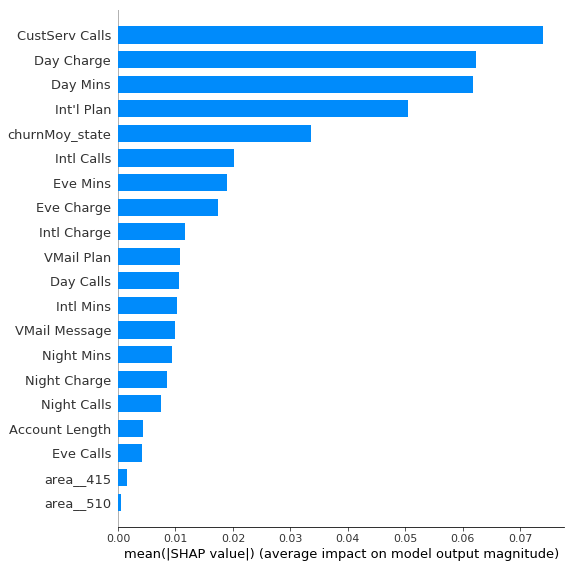

In [10]:
shap.summary_plot(shap_values[1], X_train, feature_names=feature_names, plot_type='bar')

Sur la figure ci-dessous, on peut voir l'importance des variables. On retrouve les principales variables d'importances : 'CustServ Calls', 'Day Charge', 'Day Mins' et 'Int'l Plan'

* **SHAP summary plot**

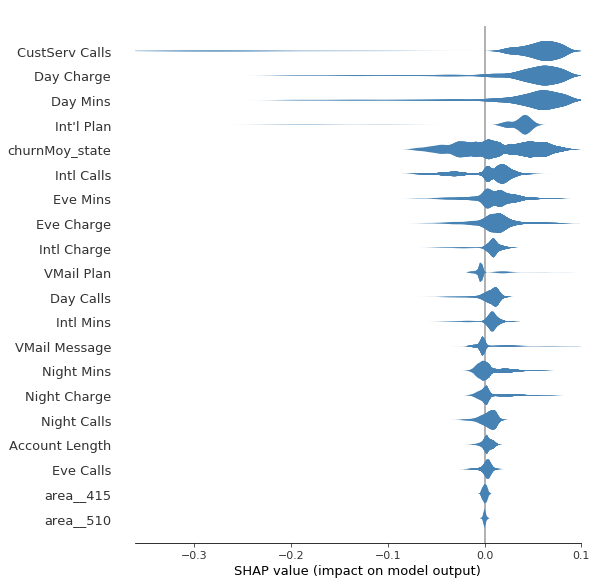

In [49]:
shap.summary_plot(shap_values[0], X_train, feature_names=feature_names, plot_type="layered_violin", color="steelblue")

La figure ci-dessous est une combinaison de l'importance des variables avec l'effet qu'elles ont, on voit plusieurs choses :
* L'importance de la variable : Les variables sont rangées dans l'ordre d'importance
* L'impacte : La position horizontale montre si la valeur est associée à une prédiction positive ou négative déterminé par la valeur Shapley. On peut voir la distribution des valeurs Shapley pour chaque variable.
* Valeur originale : La couleur indique si la variable est élevée ou faible pour l'observation

Pour résumer, la variable 'CustServ Calls' a un impact élevé et positif, le "haut" vient de la couleur rouge et l'impacte "positif" est indiqué par l'axe horizontal. Sur cette figure, on voit à la fois l'interprétation locale (points) et l'interprétation globale (amplitude) du modèle.

* **Shap dependence plot**
Sur ce type de figure on peut observer la valeur Shapley pour chaque observation par valeur de la variable. On peut également paramétrer la fonction pour qu'elle affiche la figure sur la variable avec la plus grande importance..

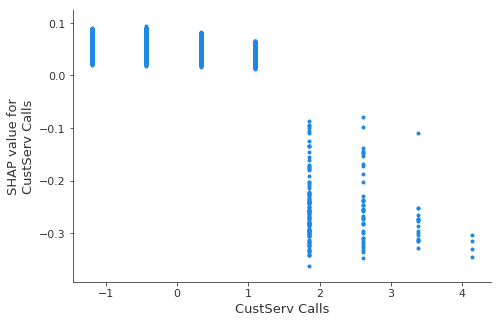

In [145]:
shap.dependence_plot("rank(0)",shap_values[0], X_train, feature_names=feature_names, interaction_index=None)

* **Clustering SHAP values**

L'objectif de cette figure est de grouper les observations similaires.

In [149]:
shap.force_plot(explainer.expected_value[0], shap_values[0], X_train, feature_names=feature_names)

Chaque position sur l'axe horizontale correspond à une observation. Le rouge signifie que la valeur de prédiction a augmenté et en bleu qu'elle a baissé. C'est une version du force plots avec l'ensemble des observations pivoté à la verticale.